<a href="https://colab.research.google.com/github/Codefedy/Heart-Disease-Predictive-Model/blob/main/HeartRisk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns 

In [2]:
from sklearn.metrics import roc_curve, roc_auc_score, auc #for model evaluation

In [3]:
from sklearn.ensemble import RandomForestClassifier #for the model

In [4]:
from sklearn.feature_selection import mutual_info_classif

In [ ]:
!pip install eli5 #for purmutation 

In [ ]:
import eli5

In [ ]:
from eli5.sklearn import PermutationImportance

In [53]:
import matplotlib.pyplot as plt

In [9]:
from sklearn.metrics import accuracy_score, classification_report

In [8]:
from sklearn.tree import DecisionTreeClassifier


In [31]:
from sklearn.metrics import confusion_matrix 

In [32]:
import xgboost as xgb

In [6]:
from sklearn.model_selection import GridSearchCV

In [ ]:
pip install shap 


In [ ]:
import shap

In [ ]:
!pip install pdpbox

In [ ]:
from pdpbox import pdp, info_plots #for partial plots

In [7]:
from sklearn.model_selection import train_test_split #for data splitting


In [ ]:
np.random.seed(123) #ensure reproducibility

In [10]:
pd.options.mode.chained_assignment = None  #hide any pandas warnings

In [11]:
from google.colab import drive

In [12]:
drive.mount('/content/drive')


Mounted at /content/drive


In [13]:
dp = pd.read_csv('/content/drive/My Drive/UWE-ML/HD_Prediction.csv')


In [ ]:
dp.head(10)

,index,Age,Sex,Chest pain type,BP,Cholesterol,FBS over 120,EKG results,Max HR,Exercise angina,ST depression,Slope of ST,Number of vessels fluro,Thallium,Heart Disease
0,0,70,1,4,130,322,0,2,109,0,2.4,2,3,3,Presence
1,1,67,0,3,115,564,0,2,160,0,1.6,2,0,7,Absence
2,2,57,1,2,124,261,0,0,141,0,0.3,1,0,7,Presence
3,3,64,1,4,128,263,0,0,105,1,0.2,2,1,7,Absence
4,4,74,0,2,120,269,0,2,121,1,0.2,1,1,3,Absence
5,5,65,1,4,120,177,0,0,140,0,0.4,1,0,7,Absence
6,6,56,1,3,130,256,1,2,142,1,0.6,2,1,6,Presence
7,7,59,1,4,110,239,0,2,142,1,1.2,2,1,7,Presence
8,8,60,1,4,140,293,0,2,170,0,1.2,2,2,7,Presence
9,9,63,0,4,150,407,0,2,154,0,4.0,2,3,7,Presence


In [14]:
dp = dp.drop(dp.columns[0], axis=1)

In [15]:

dp.columns = ['age', 'sex', 'chest_pain_type', 'resting_blood_pressure', 'cholesterol', 'fasting_blood_sugar', 'rest_ekg', 'max_heart_rate',
       'exercise_angina', 'st_depression', 'slope_of_ST', 'num_major_vessels', 'thallium', 'target']



In [16]:
dp['sex'][dp['sex'] == 'female'] = 0
dp['sex'][dp['sex'] == 'male'] = 1

dp['chest_pain_type'][dp['chest_pain_type'] == 1] = 'typical angina'
dp['chest_pain_type'][dp['chest_pain_type'] == 2] = 'atypical angina'
dp['chest_pain_type'][dp['chest_pain_type'] == 3] = 'non-anginal pain'
dp['chest_pain_type'][dp['chest_pain_type'] == 4] = 'asymptomatic'

dp['fasting_blood_sugar'][dp['fasting_blood_sugar'] == 0] = 'lower than 120mg/ml'
dp['fasting_blood_sugar'][dp['fasting_blood_sugar'] == 1] = 'greater than 120mg/ml'

dp['rest_ekg'][dp['rest_ekg'] == 0] = 'normal'
dp['rest_ekg'][dp['rest_ekg'] == 1] = 'left ventricular hypertrophy'
dp['rest_ekg'][dp['rest_ekg'] == 2] = 'ST-T wave abnormality'

dp['exercise_angina'][dp['exercise_angina'] == 0] = 'no'
dp['exercise_angina'][dp['exercise_angina'] == 1] = 'yes'

dp['slope_of_ST'][dp['slope_of_ST'] == 1] = 'upsloping'
dp['slope_of_ST'][dp['slope_of_ST'] == 2] = 'flat'
dp['slope_of_ST'][dp['slope_of_ST'] == 3] = 'downsloping'

dp['thallium'][dp['thallium'] == 3] = 'normal'
dp['thallium'][dp['thallium'] == 6] = 'fixed defect'
dp['thallium'][dp['thallium'] == 7] = 'reversable defect'

dp['target'][dp['target'] == 'Absence'] = 0
dp['target'][dp['target'] == 'Presence'] = 1

In [17]:
dp['sex'] = dp['sex'].astype('object')
dp['chest_pain_type'] = dp['chest_pain_type'].astype('object')
dp['fasting_blood_sugar'] = dp['fasting_blood_sugar'].astype('object')
dp['rest_ekg'] = dp['rest_ekg'].astype('object')
dp['exercise_angina'] = dp['exercise_angina'].astype('object')
dp['slope_of_ST'] = dp['slope_of_ST'].astype('object')
dp['thallium'] = dp['thallium'].astype('object')
dp['target'] = dp['target'].astype('int64')

In [ ]:
dp.dtypes

age                         int64
sex                        object
chest_pain_type            object
resting_blood_pressure      int64
cholesterol                 int64
fasting_blood_sugar        object
rest_ekg                   object
max_heart_rate              int64
exercise_angina            object
st_depression             float64
slope_of_ST                object
num_major_vessels           int64
thallium                   object
target                      int64
dtype: object

In [ ]:

dp.head()
     


,age,sex,chest_pain_type,resting_blood_pressure,cholesterol,fasting_blood_sugar,rest_ekg,max_heart_rate,exercise_angina,st_depression,slope_of_ST,num_major_vessels,thallium,target
0,70,1,asymptomatic,130,322,lower than 120mg/ml,ST-T wave abnormality,109,no,2.4,flat,3,normal,1
1,67,0,non-anginal pain,115,564,lower than 120mg/ml,ST-T wave abnormality,160,no,1.6,flat,0,reversable defect,0
2,57,1,atypical angina,124,261,lower than 120mg/ml,normal,141,no,0.3,upsloping,0,reversable defect,1
3,64,1,asymptomatic,128,263,lower than 120mg/ml,normal,105,yes,0.2,flat,1,reversable defect,0
4,74,0,atypical angina,120,269,lower than 120mg/ml,ST-T wave abnormality,121,yes,0.2,upsloping,1,normal,0


In [18]:


dp = pd.get_dummies(dp, drop_first=True)



<ipython-input-18-01564fb0aa47>:1: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  dp = pd.get_dummies(dp, drop_first=True)


In [ ]:


dp.head()



,age,resting_blood_pressure,cholesterol,max_heart_rate,st_depression,num_major_vessels,target,sex_1,chest_pain_type_atypical angina,chest_pain_type_non-anginal pain,chest_pain_type_typical angina,fasting_blood_sugar_lower than 120mg/ml,rest_ekg_left ventricular hypertrophy,rest_ekg_normal,exercise_angina_yes,slope_of_ST_flat,slope_of_ST_upsloping,thallium_normal,thallium_reversable defect
0,70,130,322,109,2.4,3,1,1,0,0,0,1,0,0,0,1,0,1,0
1,67,115,564,160,1.6,0,0,0,0,1,0,1,0,0,0,1,0,0,1
2,57,124,261,141,0.3,0,1,1,1,0,0,1,0,1,0,0,1,0,1
3,64,128,263,105,0.2,1,0,1,0,0,0,1,0,1,1,1,0,0,1
4,74,120,269,121,0.2,1,0,0,1,0,0,1,0,0,1,0,1,1,0


In [ ]:
print(dp.shape)

(270, 19)


In [ ]:
print(dp['target'].value_counts())

0    150
1    120
Name: target, dtype: int64


In [ ]:
correlation_matrix = dp.corr()
print(correlation_matrix)

                                              age  resting_blood_pressure  \
age                                      1.000000                0.273053   
resting_blood_pressure                   0.273053                1.000000   
cholesterol                              0.220056                0.173019   
max_heart_rate                          -0.402215               -0.039136   
st_depression                            0.194234                0.222800   
num_major_vessels                        0.356081                0.085697   
target                                   0.212322                0.155383   
sex_1                                   -0.094401               -0.062693   
chest_pain_type_atypical angina         -0.149708               -0.074208   
chest_pain_type_non-anginal pain        -0.039605               -0.064480   
chest_pain_type_typical angina           0.044070                0.157941   
fasting_blood_sugar_lower than 120mg/ml -0.123458               -0.155681   

Checking missing value..

In [ ]:
print(dp.isnull().sum())


dp = dp.fillna(dp.mean())

Everything looks goo now... Its time to start training and test

MODELLING

In [19]:
X_train, X_test, y_train, y_test = train_test_split(dp.drop('target', 1), dp['target'], test_size = 0.2, random_state=42)

<ipython-input-19-2ff0288a9922>:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X_train, X_test, y_train, y_test = train_test_split(dp.drop('target', 1), dp['target'], test_size = 0.2, random_state=42)


In [20]:
model = DecisionTreeClassifier()

In [21]:
hyperparameters = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 3]
}


In [22]:
grid_search = GridSearchCV(model, hyperparameters, cv=5)
grid_search.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 7], 'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5, 10]})

In [23]:
best_params = grid_search.best_params_
best_score = grid_search.best_score_


In [24]:
print(best_params)
print(best_score)

{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10}
0.7181818181818181


In [25]:
best_dt_classifier = DecisionTreeClassifier(**best_params)
best_dt_classifier.fit(X_train, y_train)


DecisionTreeClassifier(max_depth=5, min_samples_leaf=2, min_samples_split=10)

In [26]:
y_pred_test = best_dt_classifier.predict(X_test)
y_pred_train = best_dt_classifier.predict(X_train)


In [27]:
print("Decision Tree:")
print("Training performance:")
print(classification_report(y_train, y_pred_train))
print("Test performance:")
print(classification_report(y_test, y_pred_test))

Decision Tree:
Training performance:
              precision    recall  f1-score   support

           0       0.85      0.94      0.89       117
           1       0.92      0.80      0.85        99

    accuracy                           0.88       216
   macro avg       0.88      0.87      0.87       216
weighted avg       0.88      0.88      0.87       216

Test performance:
              precision    recall  f1-score   support

           0       0.75      0.82      0.78        33
           1       0.67      0.57      0.62        21

    accuracy                           0.72        54
   macro avg       0.71      0.69      0.70        54
weighted avg       0.72      0.72      0.72        54



In [34]:
confusion_mtx_train = confusion_matrix(y_train, y_pred_train)
confusion_mtx_test = confusion_matrix(y_test, y_pred_test)


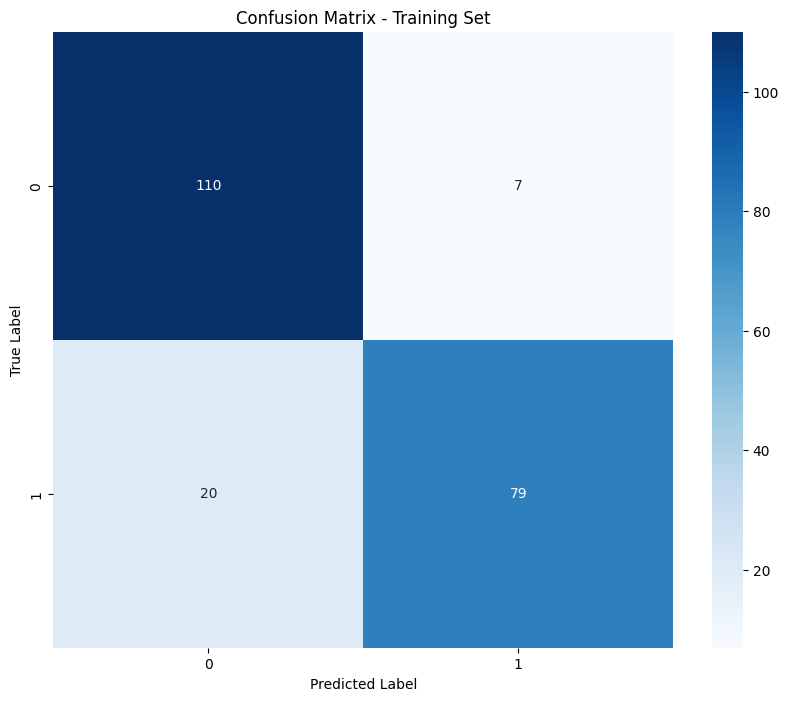

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx_train, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Training Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

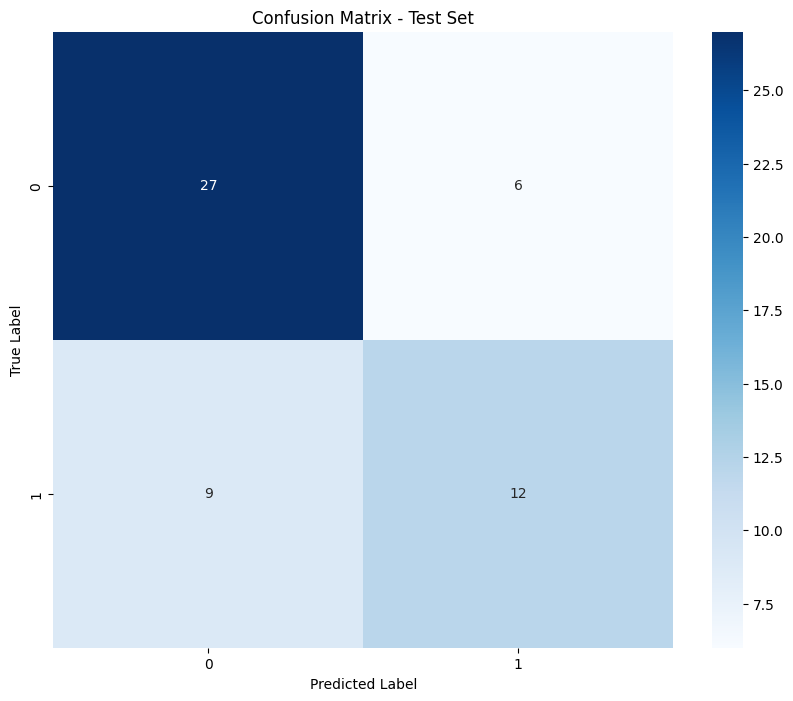

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx_test, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Test Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

For training

In [35]:
tn, fp, fn, tp = confusion_mtx_train.ravel()



In [36]:
sensitivity_train = tp / (tp + fn)
specificity_train = tn / (tn + fp)

In [ ]:
print(f"Training set:\nSensitivity: {sensitivity_train}\nSpecificity: {specificity_train}")

Training set:
Sensitivity: 0.797979797979798
Specificity: 0.9401709401709402


For testing

In [ ]:
tn, fp, fn, tp = confusion_mtx_test.ravel()

In [37]:
sensitivity_test = tp / (tp + fn)
specificity_test = tn / (tn + fp)

print(f"Test set:\nSensitivity: {sensitivity_test}\nSpecificity: {specificity_test}")

Test set:
Sensitivity: 0.797979797979798
Specificity: 0.9401709401709402


In [ ]:
model.fit(X_train, y_train)


DecisionTreeClassifier()

In [ ]:
perm = PermutationImportance(model, random_state=42).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.1000 ± 0.0444,thallium_normal
0.0667 ± 0.1185,num_major_vessels
0.0519 ± 0.0148,age
0.0370 ± 0.0524,st_depression
0.0259 ± 0.0687,chest_pain_type_atypical angina
0.0111 ± 0.0181,slope_of_ST_upsloping
0.0111 ± 0.0181,slope_of_ST_flat
0.0074 ± 0.0181,thallium_reversable defect
0.0037 ± 0.0148,max_heart_rate
0.0037 ± 0.0148,chest_pain_type_non-anginal pain


FEATURE IMPORTANCE

In [ ]:
 if isinstance(model, DecisionTreeClassifier):
       
        feature_importance = model.feature_importances_
        feature_names = X_train.columns.tolist()

In [ ]:
sorted_indices = np.argsort(feature_importance)[::-1]

In [ ]:
sorted_feature_importance = feature_importance[sorted_indices]

In [ ]:
sorted_feature_names = [feature_names[i] for i in sorted_indices]

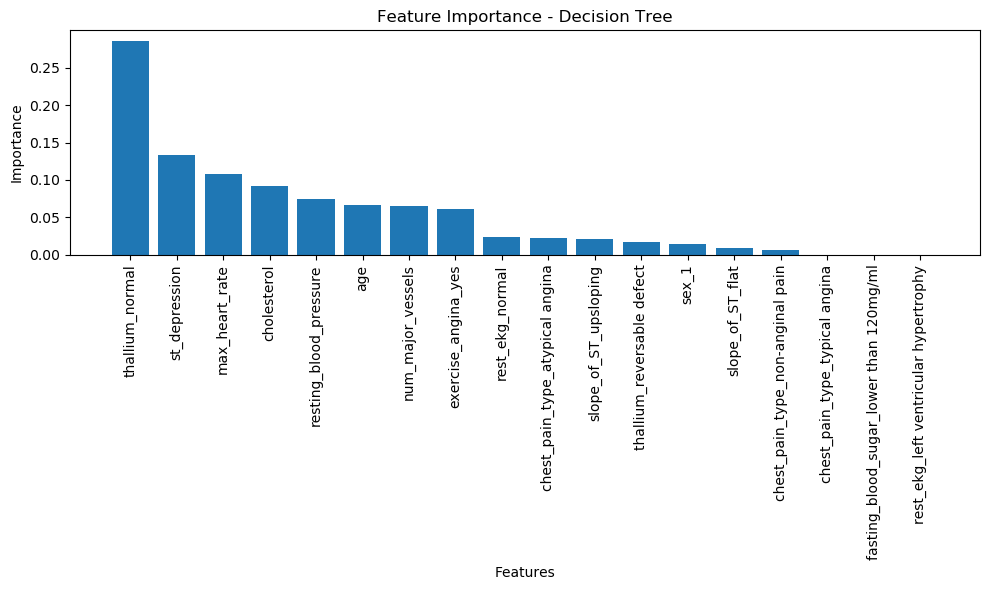

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_feature_importance)), sorted_feature_importance)
plt.xticks(range(len(sorted_feature_importance)), sorted_feature_names, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance - Decision Tree')
plt.tight_layout()
plt.show()

SHAP ANALYSIS TO GAIN INSIGHT AND MAKE INFORMED DECISION

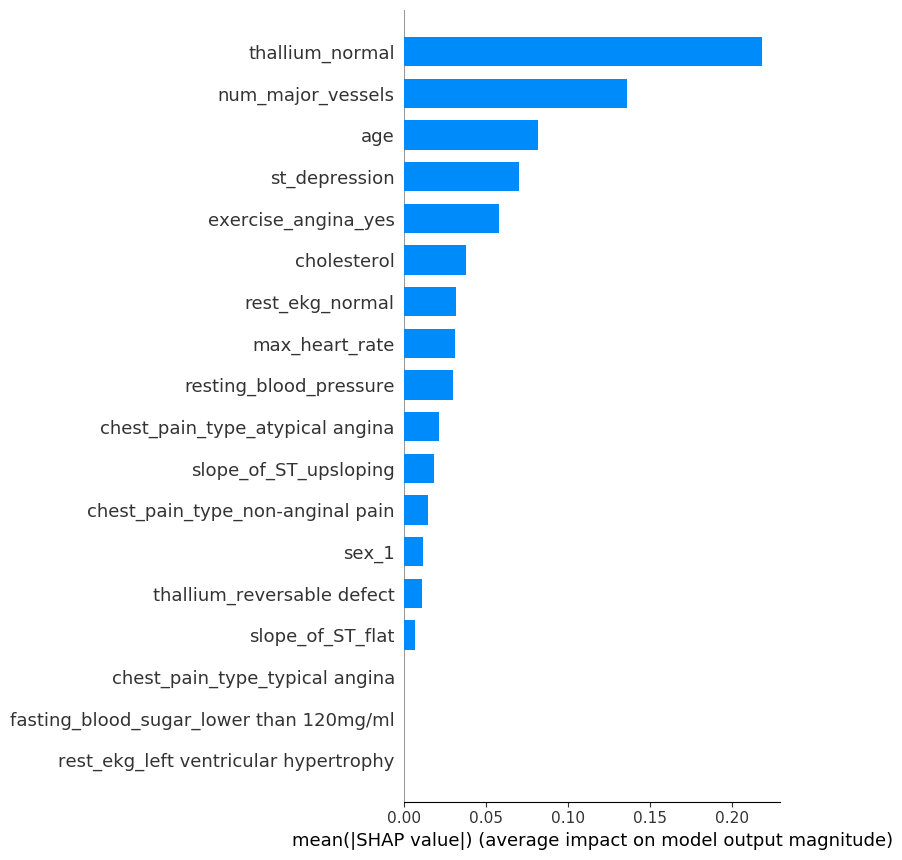

In [ ]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values[1], X_test, plot_type="bar")

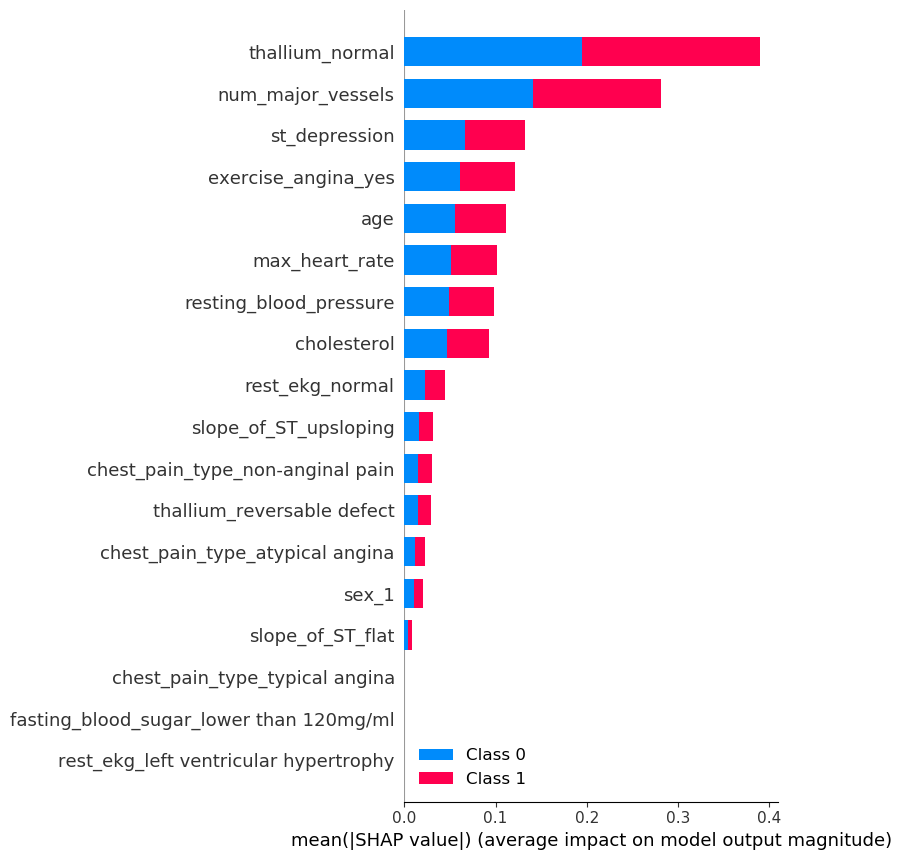

In [ ]:
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:
explainer = shap.Explainer(model)
shap_values = explainer.shap_values(X_test)

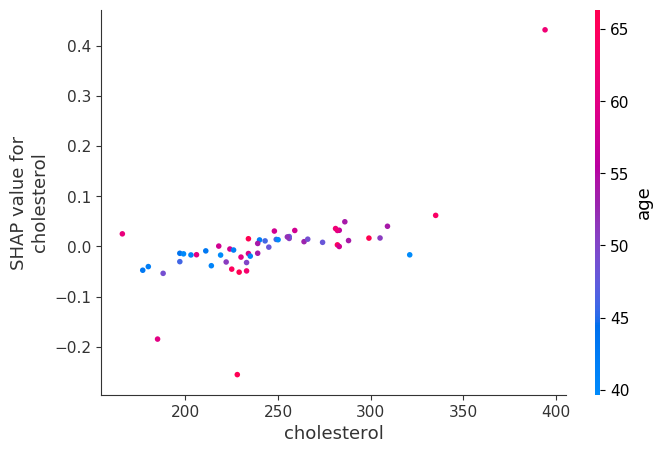

In [ ]:
shap.dependence_plot('cholesterol', shap_values[1], X_test, interaction_index="age")

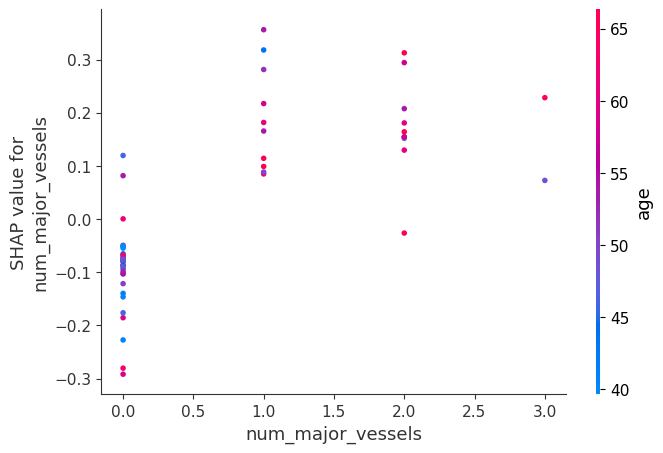

In [ ]:
shap.dependence_plot('num_major_vessels', shap_values[1], X_test, interaction_index="age")

ROC CURVE AND SCORE

In [ ]:
from sklearn.metrics import roc_curve, auc

AUC  GRADING

    0.90 - 1.00 = excellent

    0.80 - 0.90 = good

    0.70 - 0.80 = fair

    0.60 - 0.70 = poor
    
    0.50 - 0.60 = fail

In [38]:
y_pred_prob = best_dt_classifier.predict_proba(X_test)[:,1]

In [39]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

In [40]:
roc_auc = auc(fpr, tpr)
print("ROC AUC: %0.2f" % roc_auc)


ROC AUC: 0.77


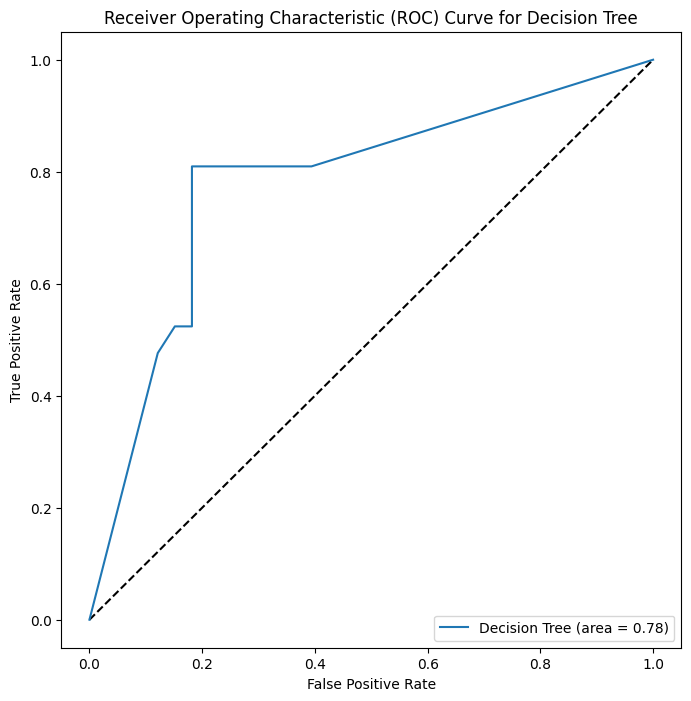

In [ ]:
plt.figure(figsize=(8,8))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='Decision Tree (area = %0.2f)' % roc_auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Decision Tree')
plt.legend(loc="lower right")
plt.show()

LEARNING CURVE

In [ ]:
from sklearn.model_selection import learning_curve

In [ ]:
train_sizes = np.linspace(0.1, 1.0, 10) 

In [ ]:
train_sizes, train_scores, val_scores = learning_curve(model, X_train, y_train, train_sizes=train_sizes, cv=5)

In [ ]:
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
val_scores_mean = np.mean(val_scores, axis=1)
val_scores_std = np.std(val_scores, axis=1)

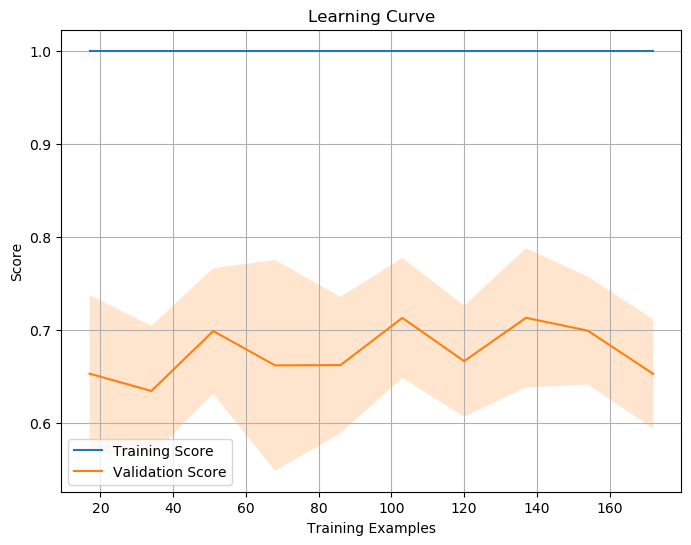

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_scores_mean, label='Training Score')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2)
plt.plot(train_sizes, val_scores_mean, label='Validation Score')
plt.fill_between(train_sizes, val_scores_mean - val_scores_std, val_scores_mean + val_scores_std, alpha=0.2)
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.grid(True)
plt.show()

In [ ]:
print("Mean Training Score:", train_scores_mean[-1])
print("Standard Deviation of Training Score:", train_scores_std[-1])
print("Mean Validation Score:", val_scores_mean[-1])
print("Standard Deviation of Validation Score:", val_scores_std[-1])

Mean Training Score: 1.0
Standard Deviation of Training Score: 0.0
Mean Validation Score: 0.6530655391120507
Standard Deviation of Validation Score: 0.05853755742521599


RANDOM FOREST

In [55]:
X_train, X_test, y_train, y_test = train_test_split(dp.drop('target', 1), dp['target'], test_size = 0.2, random_state=42)

<ipython-input-55-2ff0288a9922>:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X_train, X_test, y_train, y_test = train_test_split(dp.drop('target', 1), dp['target'], test_size = 0.2, random_state=42)


LETS VISUALIZE THE TREE AND SEE WHAT IS HAPPENING THERE.

In [ ]:
from sklearn.tree import export_graphviz 

In [ ]:
from subprocess import call

In [ ]:
from IPython.display import Image
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)

export_graphviz(model, out_file='tree.dot',
                feature_names=X_train.columns,
                class_names=['No Disease', 'Disease'],
                rounded=True, proportion=True,
                label='root', precision=2, filled=True)

call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])


Image(filename='tree.png')

In [56]:
model = RandomForestClassifier()


TUNNING AND CROSS VALIDATION

In [58]:
hyperparameters = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 3]
}


In [59]:
grid_search = GridSearchCV(model, hyperparameters, cv=5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [3, 5, 7], 'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]})

In [60]:
best_params = grid_search.best_params_
best_score = grid_search.best_score_


In [61]:
print(best_params)
print(best_score)

{'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}
0.8199788583509514


In [62]:
best_model = RandomForestClassifier(**best_params)
best_model.fit(X_train, y_train)


RandomForestClassifier(max_depth=5, min_samples_leaf=2, min_samples_split=5,
                       n_estimators=300)

In [63]:
y_pred_test = best_model.predict(X_test)
y_pred_train = best_model.predict(X_train)

In [64]:
print("Random Forest:")
print("Training performance:")
print(classification_report(y_train, y_pred_train))
print("Test performance:")
print(classification_report(y_test, y_pred_test))


Random Forest:
Training performance:
              precision    recall  f1-score   support

           0       0.91      0.94      0.92       117
           1       0.93      0.89      0.91        99

    accuracy                           0.92       216
   macro avg       0.92      0.91      0.92       216
weighted avg       0.92      0.92      0.92       216

Test performance:
              precision    recall  f1-score   support

           0       0.85      0.88      0.87        33
           1       0.80      0.76      0.78        21

    accuracy                           0.83        54
   macro avg       0.83      0.82      0.82        54
weighted avg       0.83      0.83      0.83        54



In [ ]:
confusion_mtx_train = confusion_matrix(y_train, y_pred_train)
confusion_mtx_test = confusion_matrix(y_test, y_pred_test)


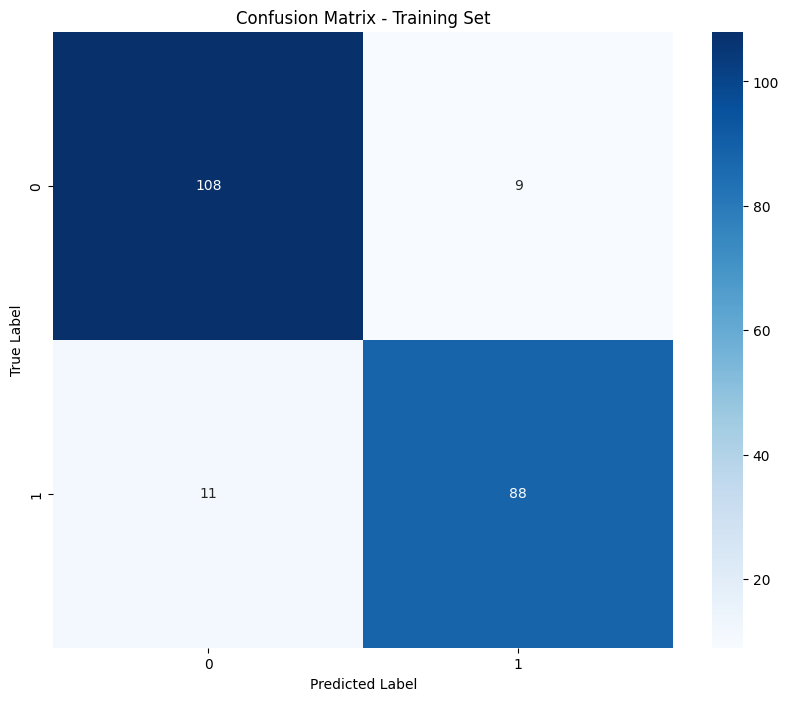

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx_train, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Training Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

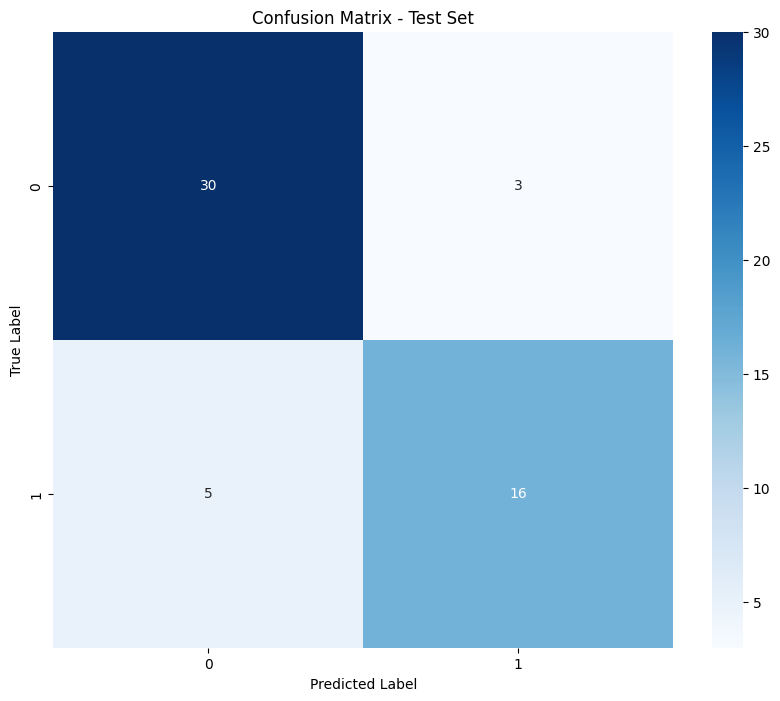

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx_test, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Test Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [65]:
tn, fp, fn, tp = confusion_mtx_train.ravel()

sensitivity_train = tp / (tp + fn)
specificity_train = tn / (tn + fp)

print(f"Training set:\nSensitivity: {sensitivity_train}\nSpecificity: {specificity_train}")

tn, fp, fn, tp = confusion_mtx_test.ravel()

sensitivity_test = tp / (tp + fn)
specificity_test = tn / (tn + fp)

print(f"Test set:\nSensitivity: {sensitivity_test}\nSpecificity: {specificity_test}")



Training set:
Sensitivity: 0.797979797979798
Specificity: 0.9401709401709402
Test set:
Sensitivity: 0.5714285714285714
Specificity: 0.8181818181818182


ROC CURVE AND SCORE

In [66]:
y_pred_prob = best_model.predict_proba(X_test)[:,1]

In [67]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

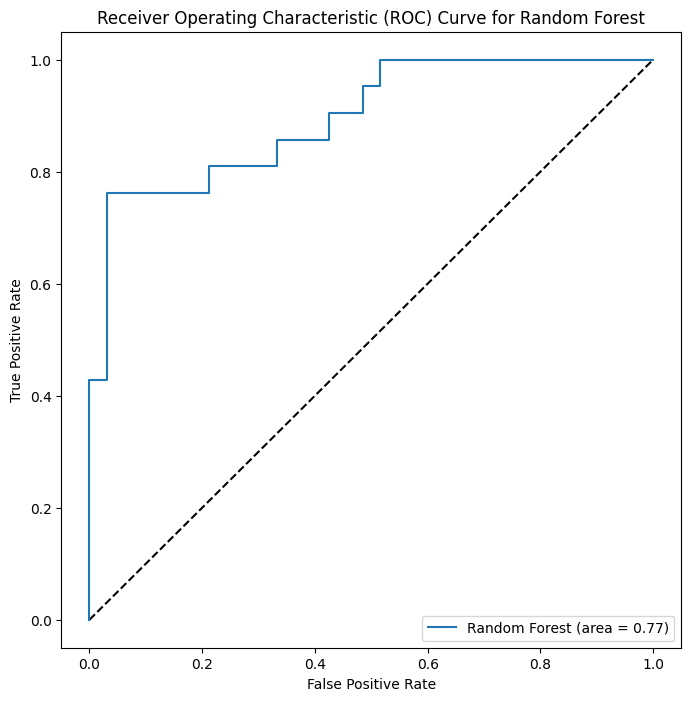

In [68]:
plt.figure(figsize=(8,8))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='Random Forest (area = %0.2f)' % roc_auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Random Forest')
plt.legend(loc="lower right")
plt.show()

LET USE INTERPRETABILITY TOOLS (FEATURE IMPORTANCE, SHAP, PDP AND LIME)

> Indented block



In [ ]:
  if isinstance(best_model, RandomForestClassifier):
       
        feature_importance = best_model.feature_importances_
        feature_names = X_train.columns.tolist()

In [ ]:
sorted_indices = np.argsort(feature_importance)[::-1]
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_names = [feature_names[i] for i in sorted_indices]

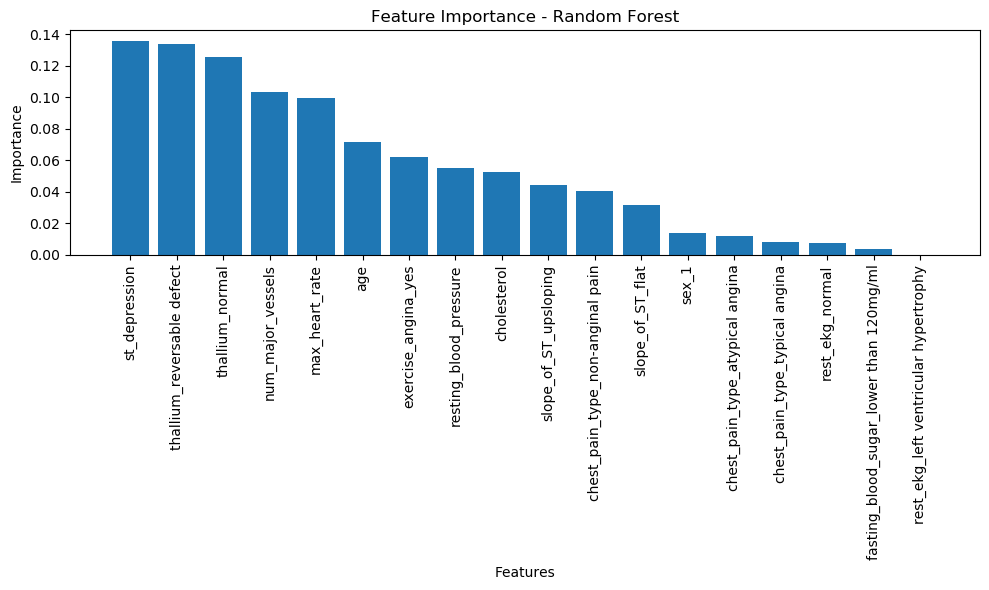

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_feature_importance)), sorted_feature_importance)
plt.xticks(range(len(sorted_feature_importance)), sorted_feature_names, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance - Random Forest')
plt.tight_layout()
plt.show()

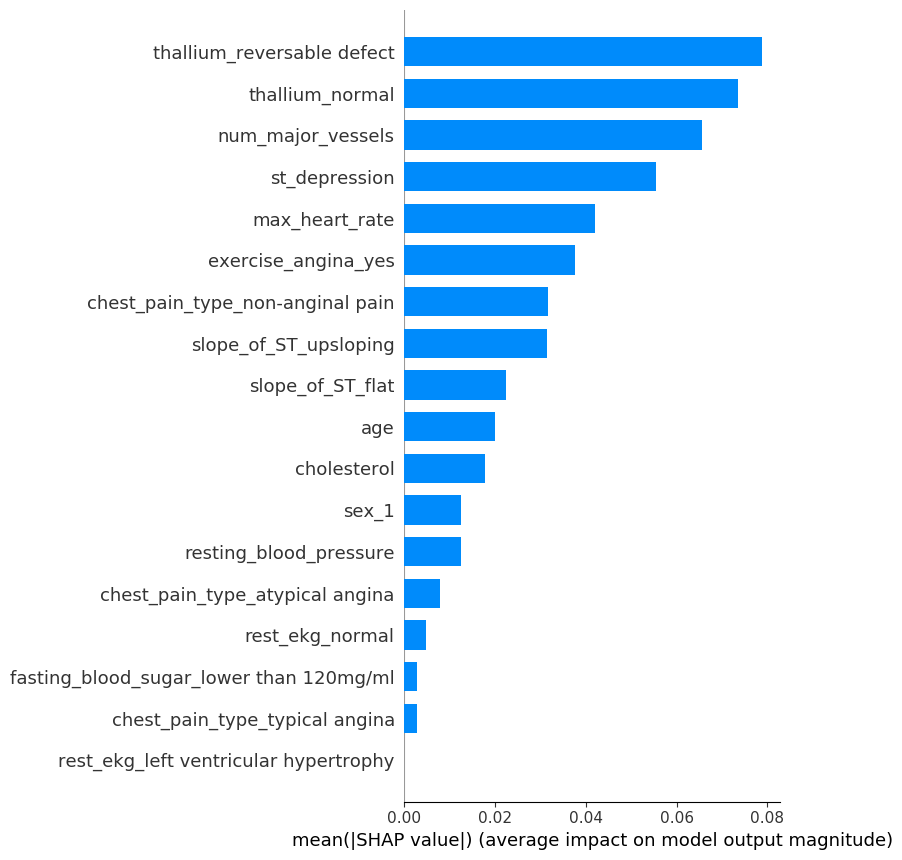

In [ ]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values[1], X_test, plot_type="bar")

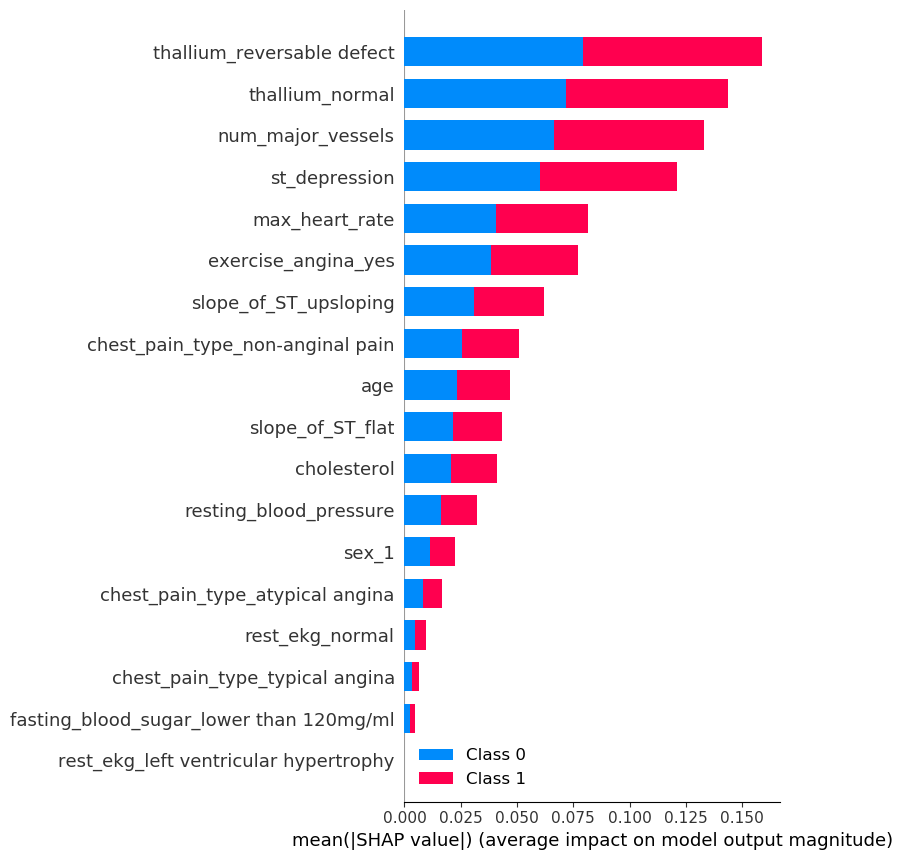

In [ ]:
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train)

In [ ]:


def heart_disease_risk_pred(best_model, patient):

    explainer = shap.TreeExplainer(best_model)
    shap_values = explainer.shap_values(patient)
    shap.initjs()
    return shap.force_plot(explainer.expected_value[1], shap_values[1], patient)

In [ ]:
data_for_prediction = X_test.iloc[5,:].astype(float)
heart_disease_risk_pred(best_model, data_for_prediction)

In [ ]:
data_for_prediction = X_test.iloc[12,:].astype(float)
heart_disease_risk_pred(best_model, data_for_prediction)

In [ ]:
data_for_prediction = X_test.iloc[3,:].astype(float)
heart_disease_risk_pred(best_model, data_for_prediction)

In [ ]:
data_for_prediction = X_test.iloc[14,:].astype(float)
heart_disease_risk_pred(best_model, data_for_prediction)

In [ ]:
pip install lime

In [ ]:
import lime.lime_tabular

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=X_train.values,
                                                  feature_names=X_train.columns,
                                                  class_names=['No Disease', 'Disease'],
                                                  mode='classification')

In [ ]:
sample_instance = X_test.iloc[0].values

In [ ]:
model.fit(X_train, y_train)

RandomForestClassifier()

patient one

In [ ]:
explanation = explainer.explain_instance(sample_instance, model.predict_proba, num_features=len(X_train.columns))

In [ ]:
explanation.show_in_notebook()

Patient 2

In [ ]:
sample_instance = X_test.iloc[1].values

In [ ]:
explanation = explainer.explain_instance(sample_instance, model.predict_proba, num_features=len(X_train.columns))

In [ ]:
explanation.show_in_notebook()

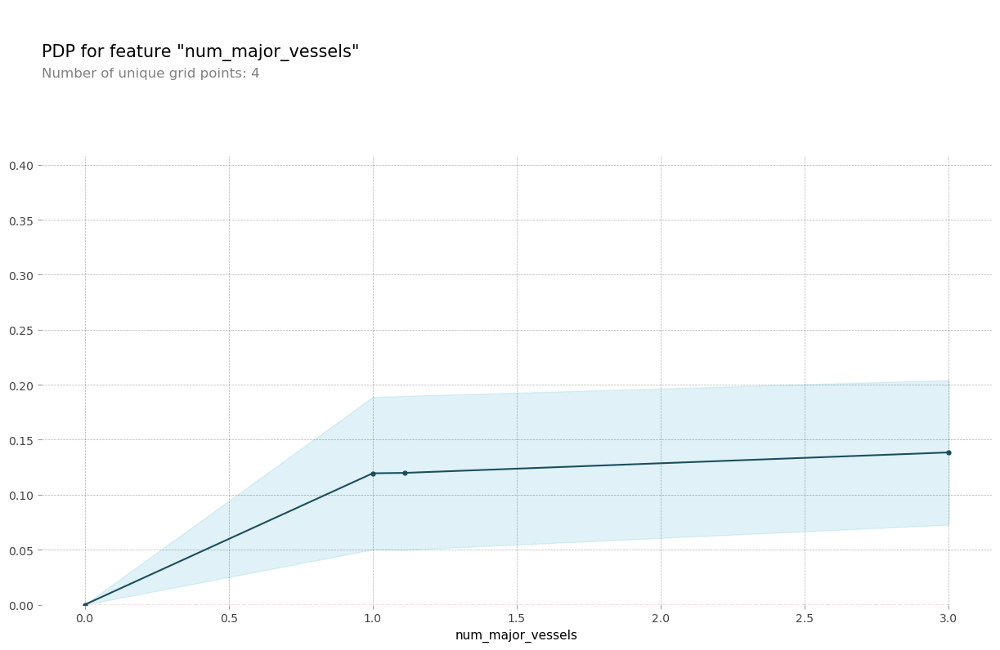

In [ ]:
base_features = dp.columns.values.tolist()
base_features.remove('target')

feat_name = 'num_major_vessels'
pdp_dist = pdp.pdp_isolate(best_model, dataset=X_test, model_features=base_features, feature=feat_name)

pdp.pdp_plot(pdp_dist, feat_name)
plt.show()

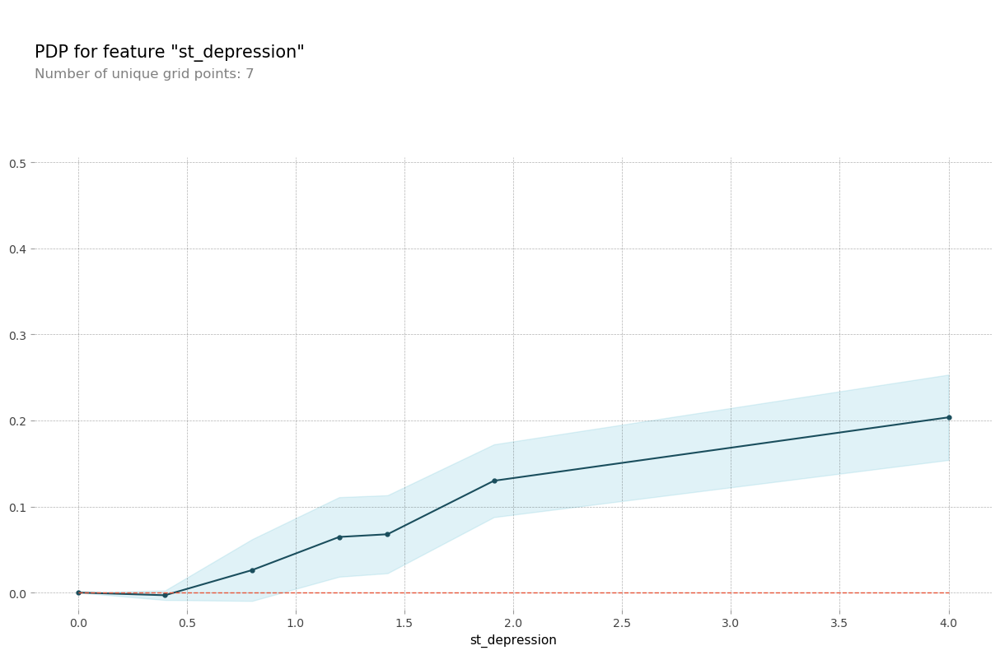

In [ ]:
feat_name = 'st_depression'
pdp_dist = pdp.pdp_isolate(best_model, dataset=X_test, model_features=base_features, feature=feat_name)

pdp.pdp_plot(pdp_dist, feat_name)
plt.show()

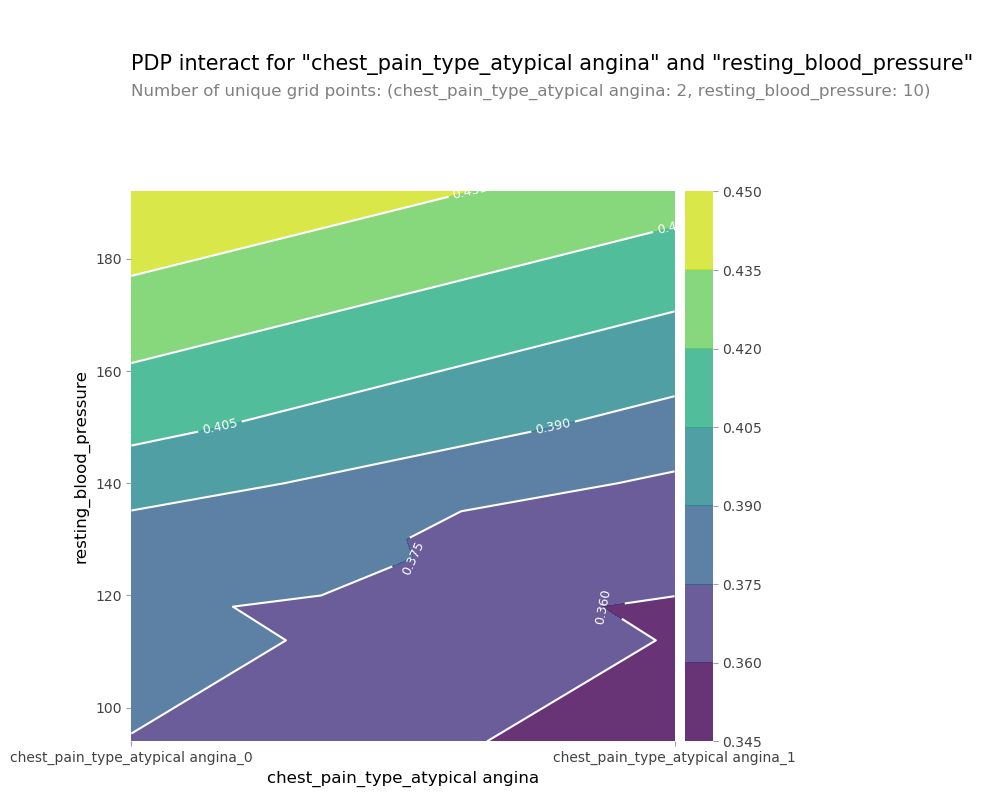

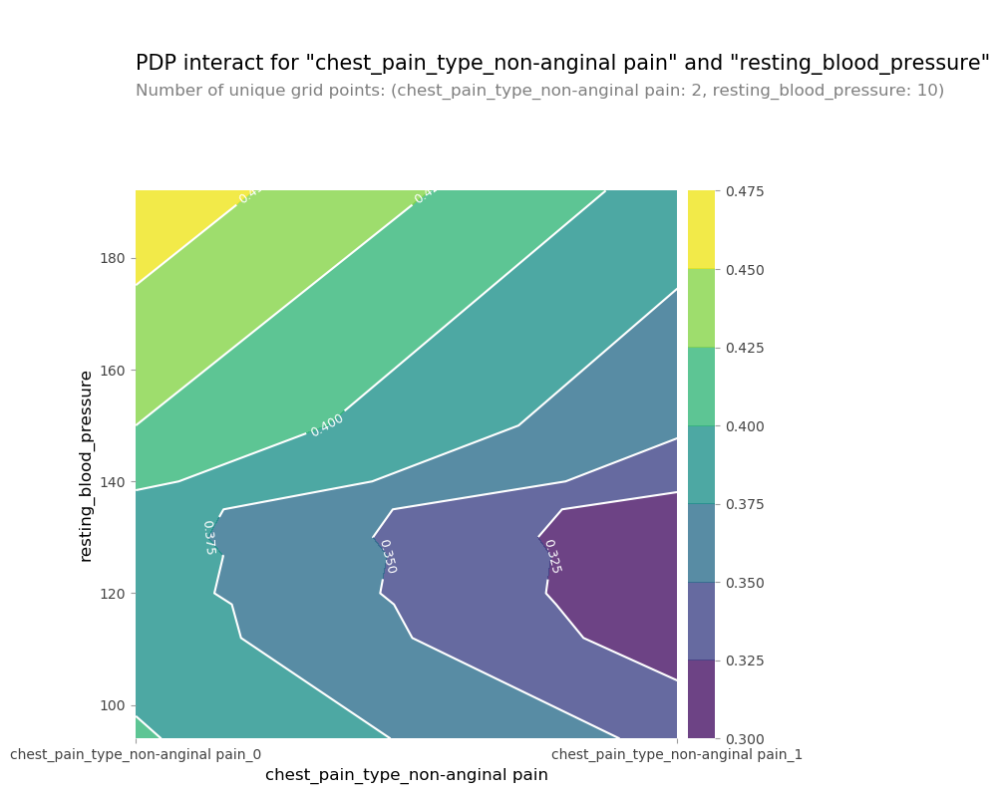

In [ ]:


inter1  =  pdp.pdp_interact(best_model, dataset=X_test, model_features=base_features, features=['chest_pain_type_atypical angina', 'resting_blood_pressure'])

pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=['chest_pain_type_atypical angina', 'resting_blood_pressure'], plot_type='contour')
plt.show()


inter1  =  pdp.pdp_interact(model=model, dataset=X_test, model_features=base_features, features=['chest_pain_type_non-anginal pain', 'resting_blood_pressure'])

pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=['chest_pain_type_non-anginal pain', 'resting_blood_pressure'], plot_type='contour')
plt.show()


XBGOOST CLASSIFIER

In [69]:
X_train, X_test, y_train, y_test = train_test_split(dp.drop('target', 1), dp['target'], test_size = 0.2, random_state=42)

<ipython-input-69-2ff0288a9922>:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X_train, X_test, y_train, y_test = train_test_split(dp.drop('target', 1), dp['target'], test_size = 0.2, random_state=42)


In [70]:
from xgboost import XGBClassifier

In [71]:
model = XGBClassifier()


In [72]:
hyperparameters = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001]
}


In [73]:
grid_search = GridSearchCV(model, hyperparameters, cv=5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...in=None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [100, 200, 300]})

In [74]:
best_params = grid_search.best_params_
best_score = grid_search.best_score_


In [75]:
print(best_params)
print(best_score )

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
0.78276955602537


In [76]:
model = XGBClassifier(**best_params)
model.fit(X_train, y_train)



XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [77]:
y_pred_test = model.predict(X_test)
y_pred_train = model.predict(X_train)

In [78]:
print("XGBoost:")
print("Training performance:")
print(classification_report(y_train, y_pred_train))
print("Test performance:")
print(classification_report(y_test, y_pred_test))



XGBoost:
Training performance:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       117
           1       0.99      0.97      0.98        99

    accuracy                           0.98       216
   macro avg       0.98      0.98      0.98       216
weighted avg       0.98      0.98      0.98       216

Test performance:
              precision    recall  f1-score   support

           0       0.81      0.91      0.86        33
           1       0.82      0.67      0.74        21

    accuracy                           0.81        54
   macro avg       0.82      0.79      0.80        54
weighted avg       0.82      0.81      0.81        54



In [ ]:
confusion_mtx_train = confusion_matrix(y_train, y_pred_train)
confusion_mtx_test = confusion_matrix(y_test, y_pred_test)


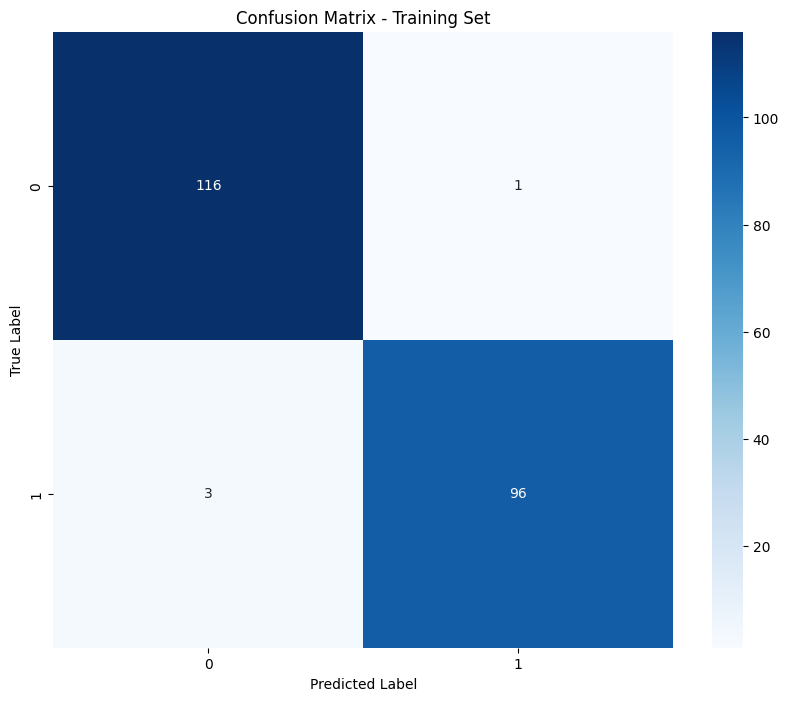

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx_train, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Training Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

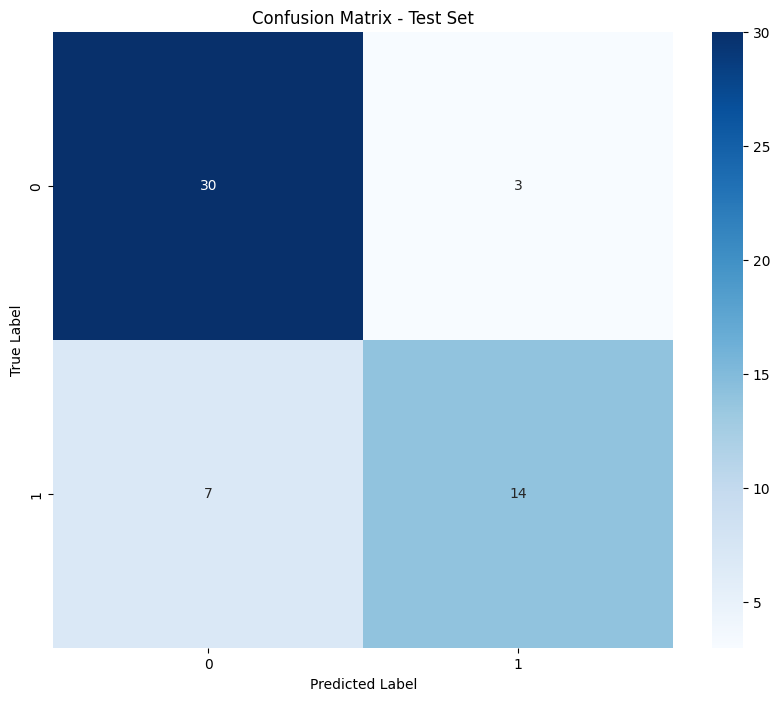

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx_test, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Test Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [79]:
tn, fp, fn, tp = confusion_mtx_train.ravel()

sensitivity_train = tp / (tp + fn)
specificity_train = tn / (tn + fp)
print(f"Training set:\nSensitivity: {sensitivity_train}\nSpecificity: {specificity_train}")


Training set:
Sensitivity: 0.797979797979798
Specificity: 0.9401709401709402


In [80]:
tn, fp, fn, tp = confusion_mtx_test.ravel()

sensitivity_test = tp / (tp + fn)
specificity_test = tn / (tn + fp)

print(f"Test set:\nSensitivity: {sensitivity_test}\nSpecificity: {specificity_test}")


Test set:
Sensitivity: 0.5714285714285714
Specificity: 0.8181818181818182


ROC CURVE AND SCORE

In [81]:
y_pred_prob = model.predict_proba(X_test)[:,1]

In [82]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

In [83]:
roc_auc = auc(fpr, tpr)
print("ROC AUC: %0.2f" % roc_auc)

ROC AUC: 0.89


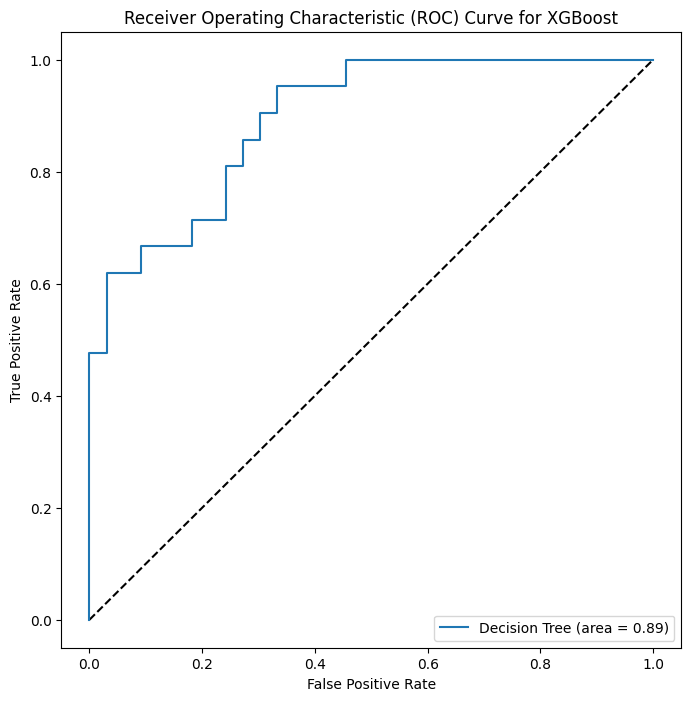

In [ ]:
plt.figure(figsize=(8,8))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='Decision Tree (area = %0.2f)' % roc_auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for XGBoost')
plt.legend(loc="lower right")
plt.show()

In [ ]:
 if isinstance(model,  XGBClassifier):
       
        feature_importance = model.feature_importances_
        feature_names = X_train.columns.tolist()

In [ ]:
sorted_indices = np.argsort(feature_importance)[::-1]
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_names = [feature_names[i] for i in sorted_indices]

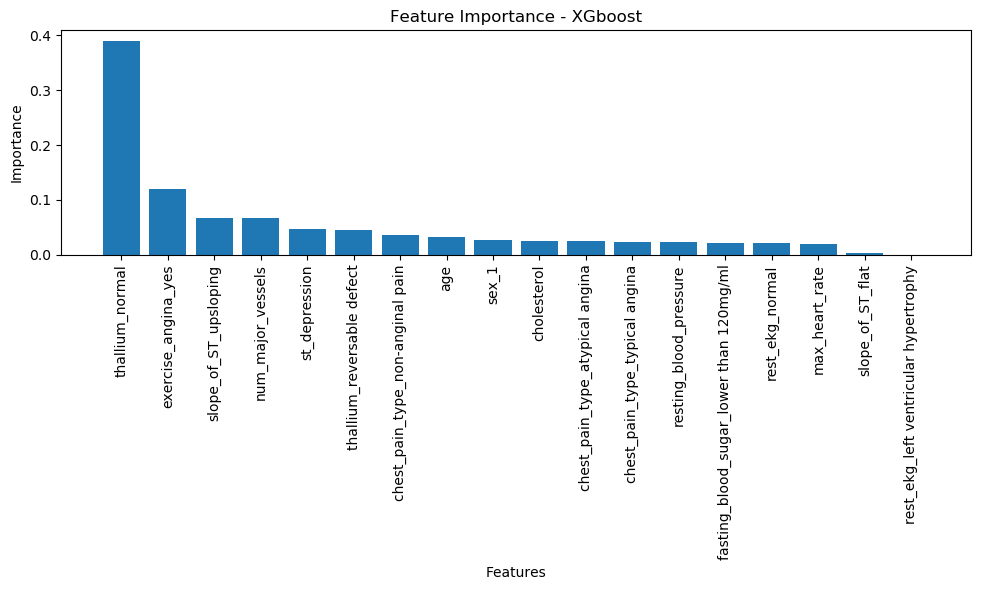

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_feature_importance)), sorted_feature_importance)
plt.xticks(range(len(sorted_feature_importance)), sorted_feature_names, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance - XGboost')
plt.tight_layout()
plt.show()

**Extra Tree Classifier**

In [84]:
X_train, X_test, y_train, y_test = train_test_split(dp.drop('target', 1), dp['target'], test_size = 0.2, random_state=42)

<ipython-input-84-2ff0288a9922>:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X_train, X_test, y_train, y_test = train_test_split(dp.drop('target', 1), dp['target'], test_size = 0.2, random_state=42)


In [85]:
from sklearn.ensemble import ExtraTreesClassifier

In [86]:
model = ExtraTreesClassifier()


In [87]:
hyperparameters = {
    'n_estimators': [50, 200, 300],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 4, 6]
}


In [88]:
grid_search = GridSearchCV(model, hyperparameters, cv=5)
grid_search.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'max_depth': [3, 5, 7], 'min_samples_split': [2, 4, 6],
                         'n_estimators': [50, 200, 300]})

In [89]:
best_params = grid_search.best_params_
best_score = grid_search.best_score_

In [90]:
print(best_params)
print(best_score)

{'max_depth': 5, 'min_samples_split': 6, 'n_estimators': 50}
0.8104651162790699


In [91]:
model = ExtraTreesClassifier(**best_params)
model.fit(X_train, y_train)

ExtraTreesClassifier(max_depth=5, min_samples_split=6, n_estimators=50)

In [94]:
y_pred_test = model.predict(X_test)
y_pred_train = model.predict(X_train)


In [95]:
print("Extra Tree:")
print("Training performance:")
print(classification_report(y_train, y_pred_train))
print("Test performance:")
print(classification_report(y_test, y_pred_test))


Extra Tree:
Training performance:
              precision    recall  f1-score   support

           0       0.89      0.91      0.90       117
           1       0.89      0.87      0.88        99

    accuracy                           0.89       216
   macro avg       0.89      0.89      0.89       216
weighted avg       0.89      0.89      0.89       216

Test performance:
              precision    recall  f1-score   support

           0       0.86      0.91      0.88        33
           1       0.84      0.76      0.80        21

    accuracy                           0.85        54
   macro avg       0.85      0.84      0.84        54
weighted avg       0.85      0.85      0.85        54



Confusion matrix

In [ ]:
confusion_mtx_train = confusion_matrix(y_train, y_pred_train)
confusion_mtx_test = confusion_matrix(y_test, y_pred_test)

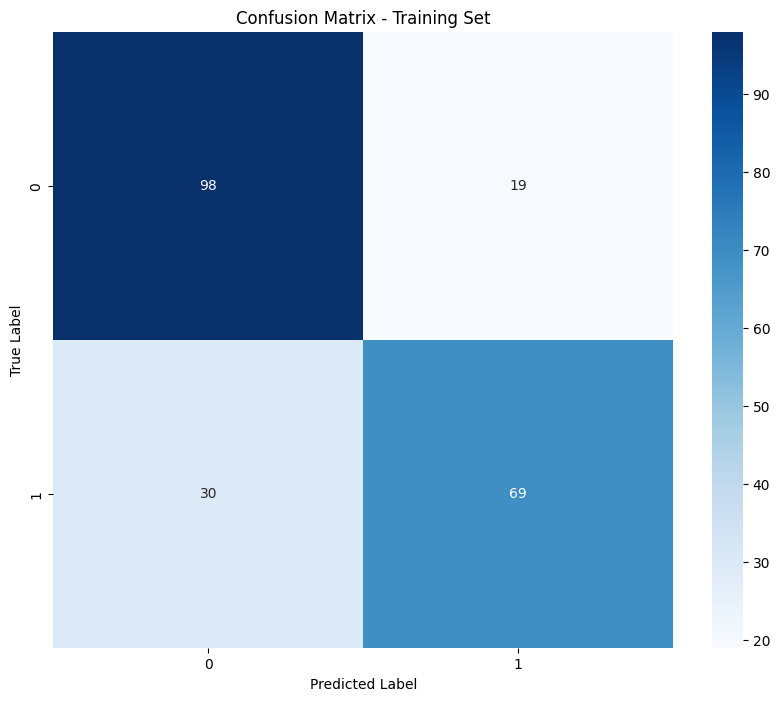

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx_train, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Training Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

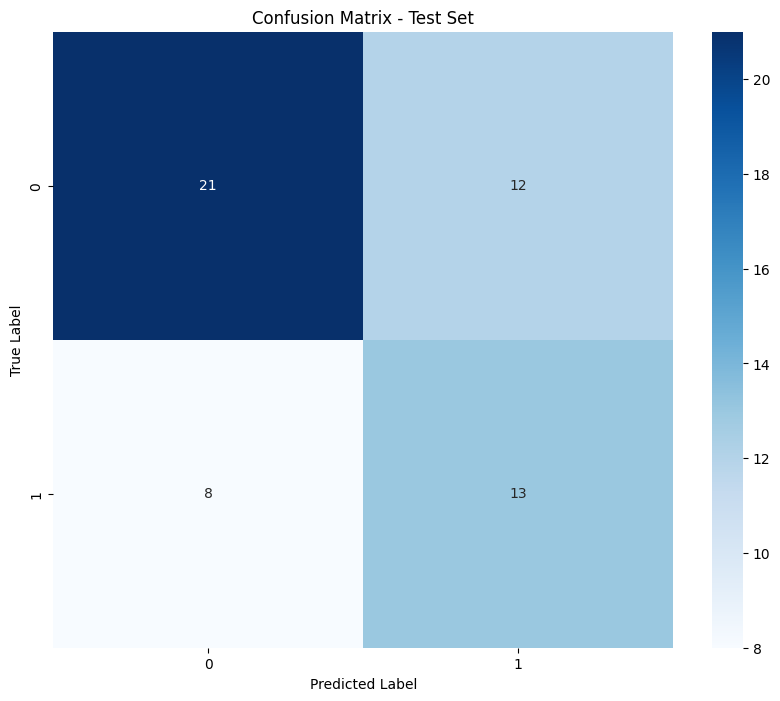

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx_test, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Test Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [96]:
tn, fp, fn, tp = confusion_mtx_train.ravel()

sensitivity_train = tp / (tp + fn)
specificity_train = tn / (tn + fp)
print(f"Training set:\nSensitivity: {sensitivity_train}\nSpecificity: {specificity_train}")


Training set:
Sensitivity: 0.797979797979798
Specificity: 0.9401709401709402


In [97]:
tn, fp, fn, tp = confusion_mtx_test.ravel()

sensitivity_test = tp / (tp + fn)
specificity_test = tn / (tn + fp)

print(f"Test set:\nSensitivity: {sensitivity_test}\nSpecificity: {specificity_test}")



Test set:
Sensitivity: 0.5714285714285714
Specificity: 0.8181818181818182


In [98]:
y_pred_prob = model.predict_proba(X_test)[:,1]

In [99]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)


In [100]:
roc_auc = auc(fpr, tpr)
print("ROC AUC: %0.2f" % roc_auc)

ROC AUC: 0.87


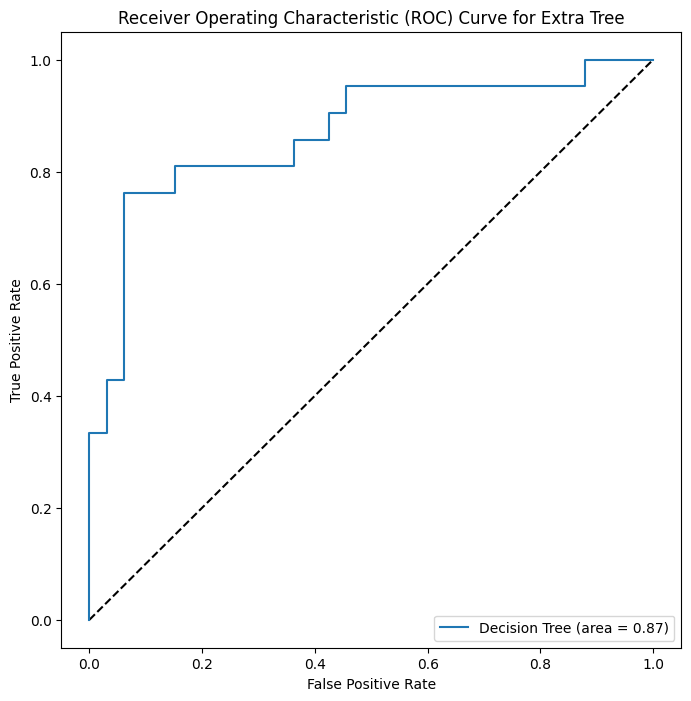

In [101]:
plt.figure(figsize=(8,8))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='Decision Tree (area = %0.2f)' % roc_auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Extra Tree')
plt.legend(loc="lower right")
plt.show()


Feature Importance

In [ ]:
 if isinstance(model,  ExtraTreesClassifier):
       
        feature_importance = model.feature_importances_
        feature_names = X_train.columns.tolist()

In [ ]:
sorted_indices = np.argsort(feature_importance)[::-1]
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_names = [feature_names[i] for i in sorted_indices]

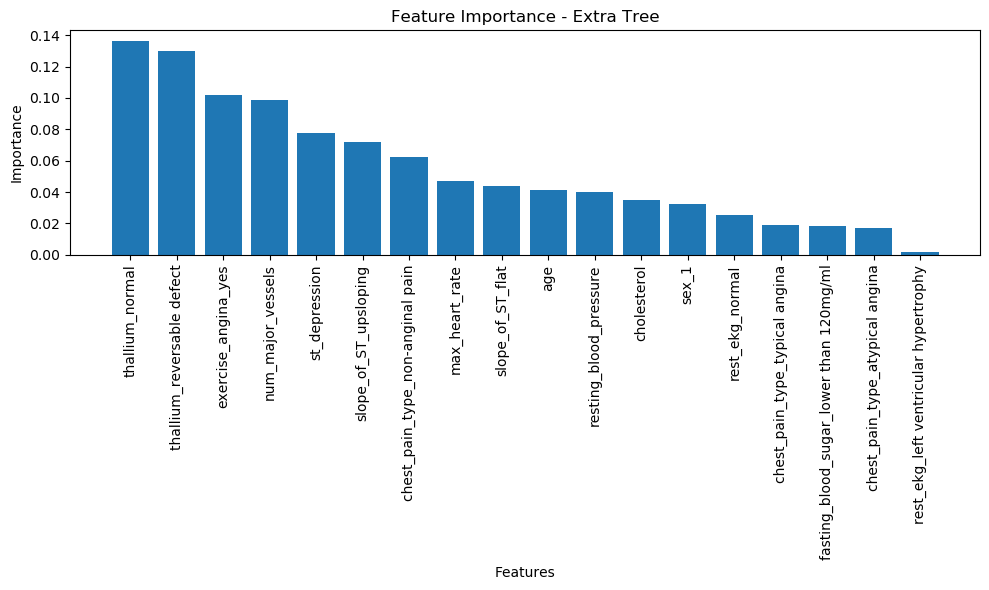

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_feature_importance)), sorted_feature_importance)
plt.xticks(range(len(sorted_feature_importance)), sorted_feature_names, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance - Extra Tree')
plt.tight_layout()
plt.show()

KNN MODEL

In [102]:
X_train, X_test, y_train, y_test = train_test_split(dp.drop('target', 1), dp['target'], test_size = 0.2, random_state=42)

<ipython-input-102-2ff0288a9922>:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X_train, X_test, y_train, y_test = train_test_split(dp.drop('target', 1), dp['target'], test_size = 0.2, random_state=42)


In [103]:
from sklearn.neighbors import KNeighborsClassifier

In [104]:
model = KNeighborsClassifier()


In [105]:
hyperparameters = {
    'n_neighbors': [3, 5, 7],
    'metric': ['euclidean', 'manhattan']
}


In [106]:
grid_search = GridSearchCV(model, hyperparameters, cv=5)
grid_search.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': [3, 5, 7]})

In [107]:
best_params = grid_search.best_params_
best_score = grid_search.best_score_


In [108]:
print(best_params)
print(best_score)

{'metric': 'manhattan', 'n_neighbors': 5}
0.6665961945031713


In [109]:
knn_classifier = KNeighborsClassifier(**best_params)
model.fit(X_train, y_train)


KNeighborsClassifier()

In [110]:
y_pred_test = model.predict(X_test)
y_pred_train = model.predict(X_train)


In [112]:

print("KNN:")
print("Training performance:")
print(classification_report(y_train, y_pred_train))
print("Test performance:")
print(classification_report(y_test, y_pred_test))


KNN:
Training performance:
              precision    recall  f1-score   support

           0       0.77      0.84      0.80       117
           1       0.78      0.70      0.74        99

    accuracy                           0.77       216
   macro avg       0.77      0.77      0.77       216
weighted avg       0.77      0.77      0.77       216

Test performance:
              precision    recall  f1-score   support

           0       0.72      0.64      0.68        33
           1       0.52      0.62      0.57        21

    accuracy                           0.63        54
   macro avg       0.62      0.63      0.62        54
weighted avg       0.64      0.63      0.63        54



CONFUSION MATRIX 

In [ ]:
confusion_mtx_train = confusion_matrix(y_train, y_pred_train)
confusion_mtx_test = confusion_matrix(y_test, y_pred_test)



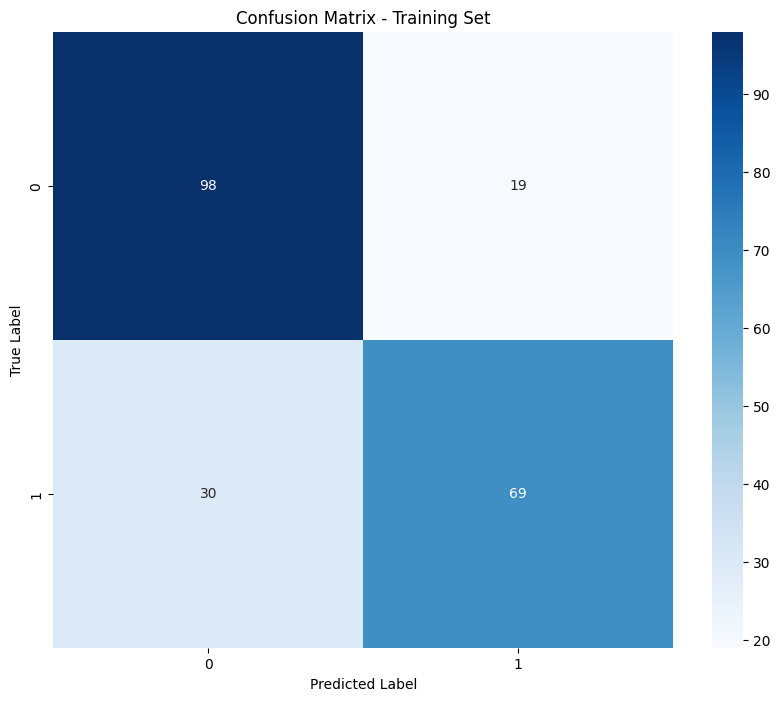

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx_train, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Training Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

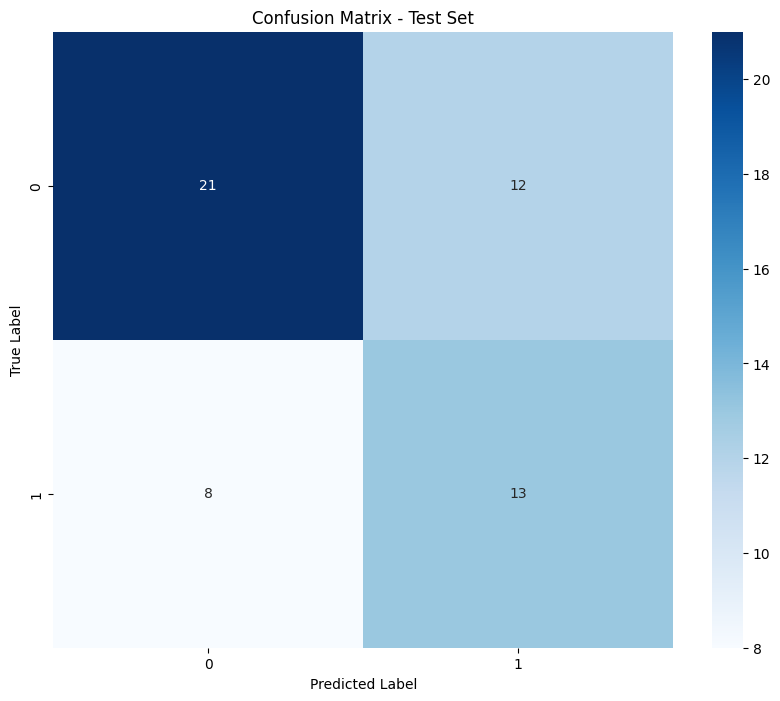

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx_test, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Test Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

Lets check for specificity and sensitivity

In [113]:
tn, fp, fn, tp = confusion_mtx_train.ravel()

sensitivity_train = tp / (tp + fn)
specificity_train = tn / (tn + fp)

print(f"Training set:\nSensitivity: {sensitivity_train}\nSpecificity: {specificity_train}")



Training set:
Sensitivity: 0.797979797979798
Specificity: 0.9401709401709402


In [114]:
tn, fp, fn, tp = confusion_mtx_test.ravel()

sensitivity_test = tp / (tp + fn)
specificity_test = tn / (tn + fp)

print(f"Test set:\nSensitivity: {sensitivity_test}\nSpecificity: {specificity_test}")


Test set:
Sensitivity: 0.5714285714285714
Specificity: 0.8181818181818182


ROC CURVE AND SCORE

In [115]:
y_pred_prob = model.predict_proba(X_test)[:,1]

In [116]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

In [117]:
roc_auc = auc(fpr, tpr)
print("ROC AUC: %0.2f" % roc_auc)

ROC AUC: 0.74


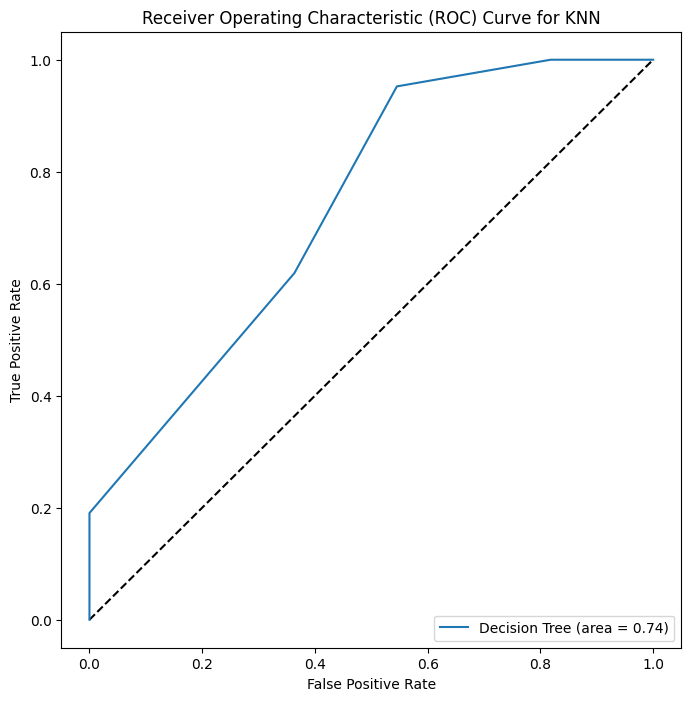

In [ ]:
plt.figure(figsize=(8,8))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='Decision Tree (area = %0.2f)' % roc_auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for KNN')
plt.legend(loc="lower right")
plt.show()

FEATURE IMPORTANCE

In [ ]:
from sklearn.inspection import permutation_importance

In [ ]:
result = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42)

In [ ]:
importances = result.importances_mean
feature_names = X_train.columns.tolist()

In [ ]:
for feature, importance in zip(feature_names, importances):
    print(f"{feature}: {importance}")

age: 0.007407407407407407
resting_blood_pressure: -0.0722222222222222
cholesterol: -0.03518518518518517
max_heart_rate: 0.09444444444444447
st_depression: 0.0
num_major_vessels: 0.0
sex_1: 0.0
chest_pain_type_atypical angina: 0.0
chest_pain_type_non-anginal pain: 0.0
chest_pain_type_typical angina: 0.0
fasting_blood_sugar_lower than 120mg/ml: 0.0
rest_ekg_left ventricular hypertrophy: 0.0
rest_ekg_normal: 0.0
exercise_angina_yes: 0.0
slope_of_ST_flat: 0.0
slope_of_ST_upsloping: 0.0
thallium_normal: 0.0
thallium_reversable defect: 0.0
